# 4. Image Enhancement

This one's going to cover a lot of material (again), where we go through mean/median filtering, sharpening, denoising, sharpening, and a lot of other stuff. Oh my....

<img src="./img/blanche.gif" />

## Point-Wise Intensity Transformation / Pixel Transformation

This refers to any pixel-by-pixel transformation that takes as input only one pixel, & uses the same transformation logic to each. It applies to:<ul><li>Image Negatives</li><li>Color Space Transformation</li><li>Log Transform</li><li>Power-law Transformation</li><li>Constrast Stretching</li><li>Scalar Quantization</li><li>Thresholding</li></ul>

and as such it is useful mostly in the preprocessing stage. Let's get started with our imports:

In [1]:
import numpy as np
from skimage import data, img_as_float, img_as_ubyte, exposure, io, color
from skimage.io import imread
from skimage.exposure import cumulative_distribution
from skimage.restoration import denoise_bilateral, denoise_nl_means, estimate_sigma
from skimage.measure import compare_psnr
from skimage.util import random_noise
from skimage.color import rgb2gray
from PIL import Image, ImageEnhance, ImageFilter
from scipy import ndimage, misc
import matplotlib.pylab as plb

### Log Transform

We've seen this before when we have needed to stretch or compress the <em>range</em> of values in an image. For example, in plotting the results of Fourier transforms, we've need to apply the log function, b/c the DC component is so much higher than the other values, such that it's difficult to even make sense of any but that one value. The point transformation function for a log transform is:
$$s = T(r) = c.log(1 + r)$$

In [5]:
def plot_image(image, title=""):
    plb.title(title, size=20)
    plb.imshow(image)
    plb.axis('off')

def plot_hist(r, g, b, title=""):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)
    plb.hist(np.array(r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
    plb.hist(np.array(g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
    plb.hist(np.array(b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
    plb.xlabel('pixel value', size=20)
    plb.ylabel('frequency', size=20)
    plb.title(title, size=20)

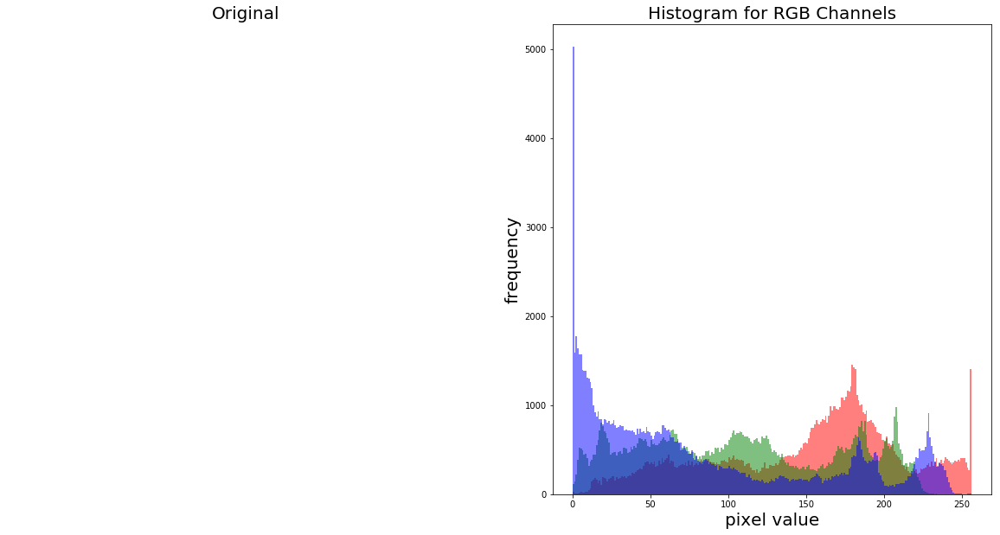

In [6]:
img = Image.open('./img/pumpkin_small.jpg')
img_r, img_g, img_b = img.split()
# plb.style.use('ggplot')
plb.figure(figsize=(20, 10))
plb.subplot(121)
plb.title('Original', size=20)
plb.axis('off')
plb.subplot(122)
plot_hist(img_r, img_g, img_b, 'Histogram for RGB Channels')
plb.show()

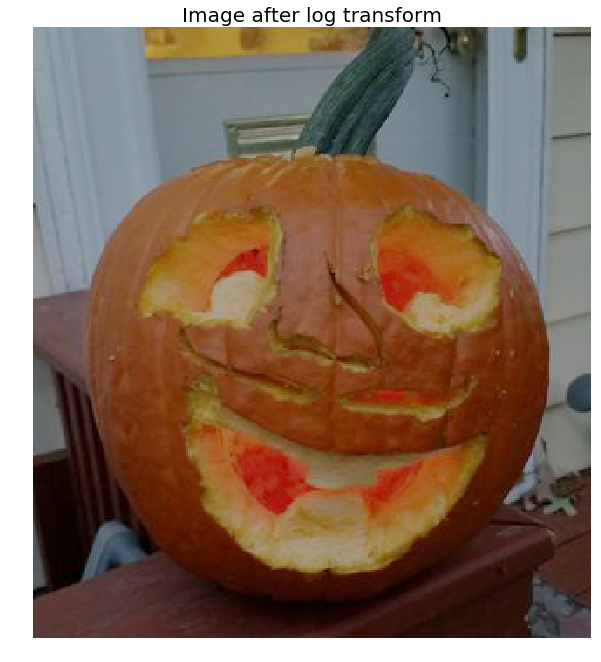

In [7]:
img = img.point(lambda i: 255 * np.log(1 + i/255))
img_r, img_g, img_b = img.split()
# plb.style.use('ggplot')
plb.figure(figsize=(10, 12))
plot_image(img, 'Image after log transform')
plb.show()

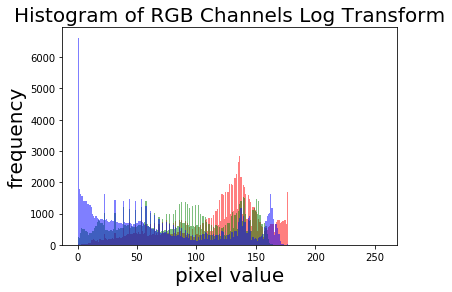

In [8]:
plot_hist(img_r, img_g, img_b, 'Histogram of RGB Channels Log Transform')
plb.show()

/home/ben/.local/lib/python3.6/site-packages/skimage/util/dtype.py:141: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


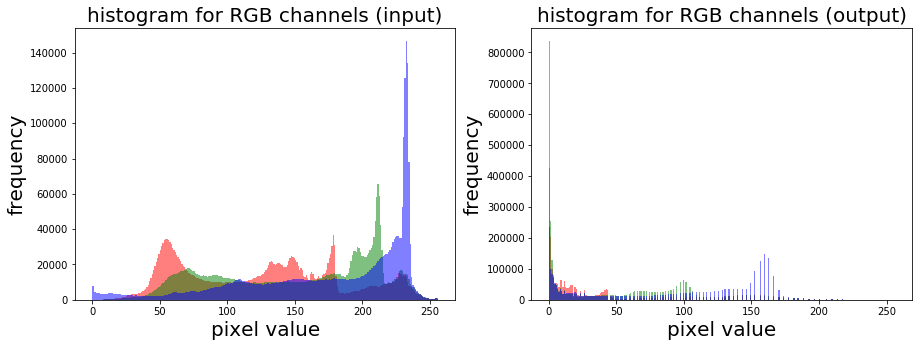

In [10]:
im = img_as_float(imread('./img/deck.jpg'))
gamma = 5
im1 = im**gamma
plb.figure(figsize=(15,5))
plb.subplot(121), plot_hist(im[...,0], im[...,1], im[...,2], 'histogram for RGB channels (input)')
plb.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2], 'histogram for RGB channels (output)')
plb.show()

### Contrast Stretching

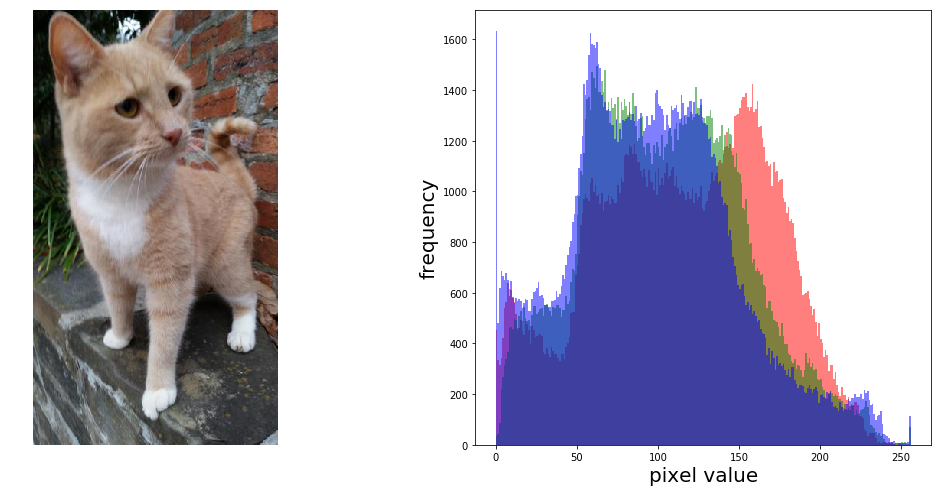

In [11]:
im = Image.open('./img/kolya_small.jpg')
im_r, im_g, im_b = im.split()
plb.figure(figsize=(18,8))
plb.subplot(121)
plot_image(im)
plb.subplot(122)
plot_hist(im_r, im_g, im_b)
plb.show()

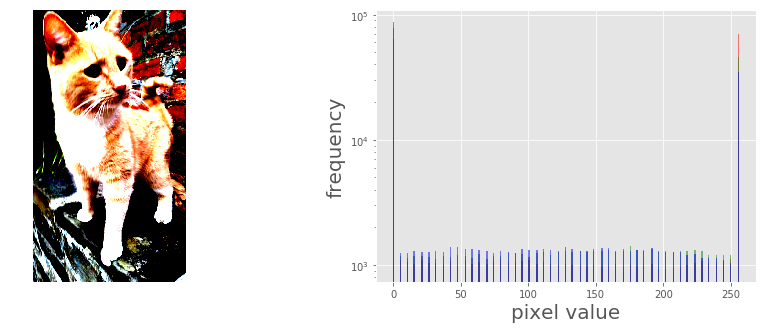

In [12]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48) # piece-wise linear function

im1 = im.point(contrast)
im_r, im_g, im_b = im1.split()
plb.style.use('ggplot')
plb.figure(figsize=(15,5))
plb.subplot(121)
plot_image(im1)
plb.subplot(122)
plot_hist(im_r, im_g, im_b)
plb.yscale('log',basey=10)
plb.show()

### Histogram Processing

The contrast stretching method above provides us a decent linear transfer function to affect the most extreme values, but there are more powerful, non-linear processes to alter the intensity histograms of an image (and therefore, the image) that are a bit more precise. We'll turn to <strong>scikit-image</strong> for these functions.

First, there's <strong>histogram equalization</strong>, which does exactly what it sounds like:

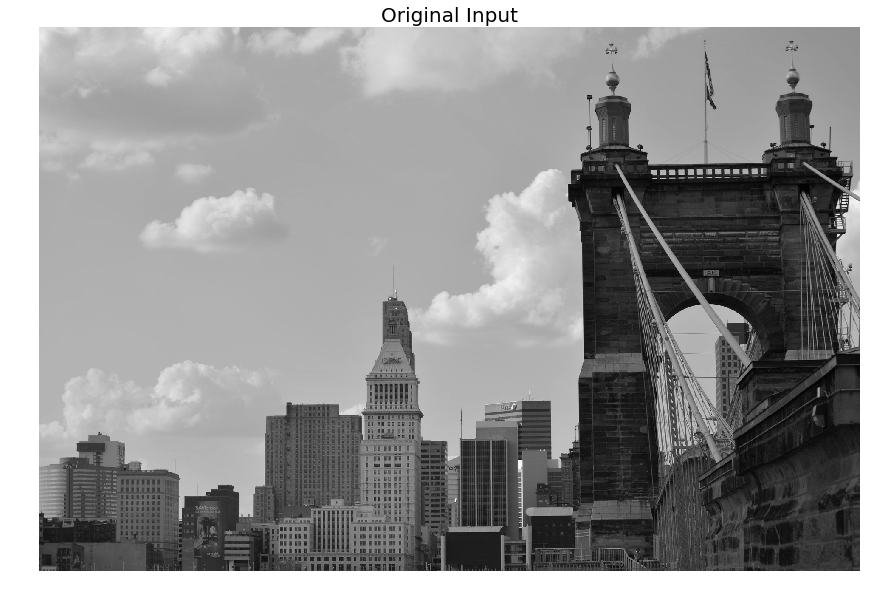

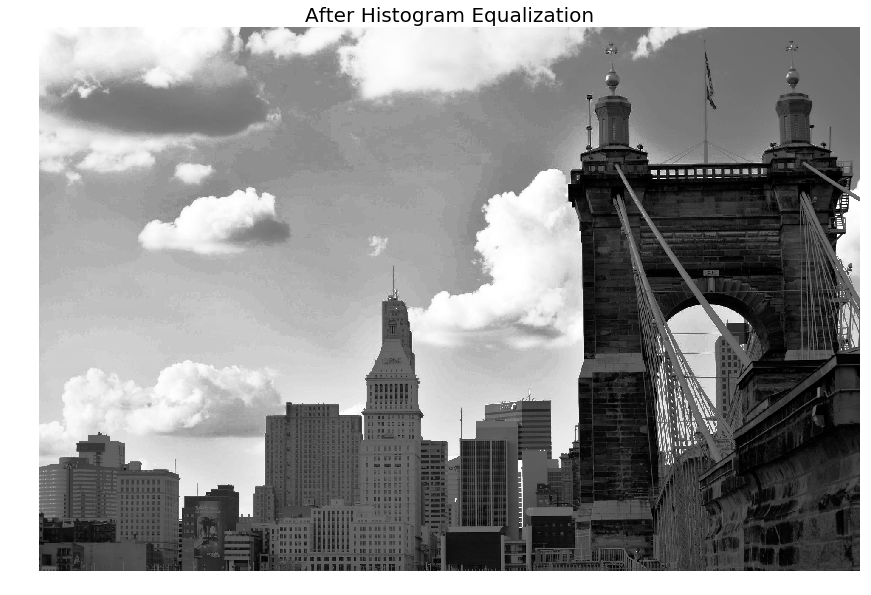

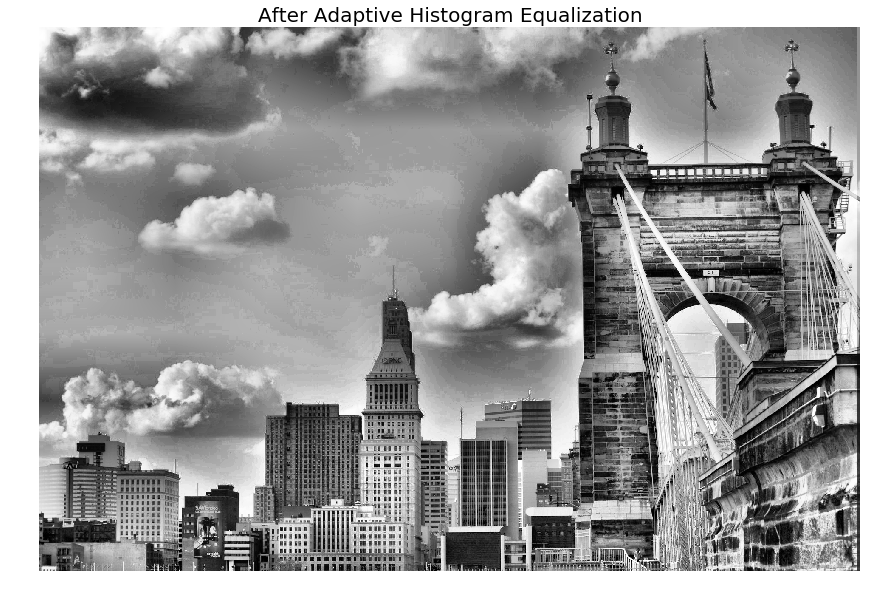

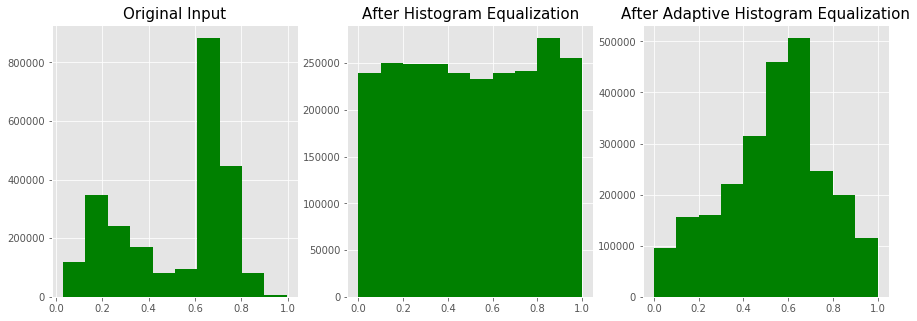

In [13]:
img = rgb2gray(imread('./img/roebling2.jpeg'))
img_eq = exposure.equalize_hist(img)
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
plb.gray()
images = [img, img_eq, img_adapteq]
titles = ['Original Input', 'After Histogram Equalization', 'After Adaptive Histogram Equalization']
for i in range(3):
    plb.figure(figsize=(20, 10))
    plot_image(images[i], titles[i])
    plb.figure(figsize=(15, 5))
for i in range(3):
    plb.subplot(1, 3, i+1)
    plb.hist(images[i].ravel(), color='g')
    plb.title(titles[i], size=15)
plb.show()
        
                 

In [17]:
import matplotlib
matplotlib.rcParams['font.size'] = 8
def plot_image_and_hist(image, axes, bins=256):
    image = img_as_float(image)
    axes_image, axes_hist = axes
    axes_cdf = axes_hist.twinx()
    axes_image.imshow(image, cmap=plb.cm.gray)
    axes_image.set_axis_off()
    axes_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    axes_hist.set_xlim(0, 1)
    axes_hist.set_xlabel('Pixel intensity', size=15)
    axes_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    axes_hist.set_yticks([])
    image_cdf, bins = exposure.cumulative_distribution(image, bins)
    axes_cdf.plot(bins, image_cdf, 'r')
    axes_cdf.set_yticks([])
    return axes_image, axes_hist, axes_cdf


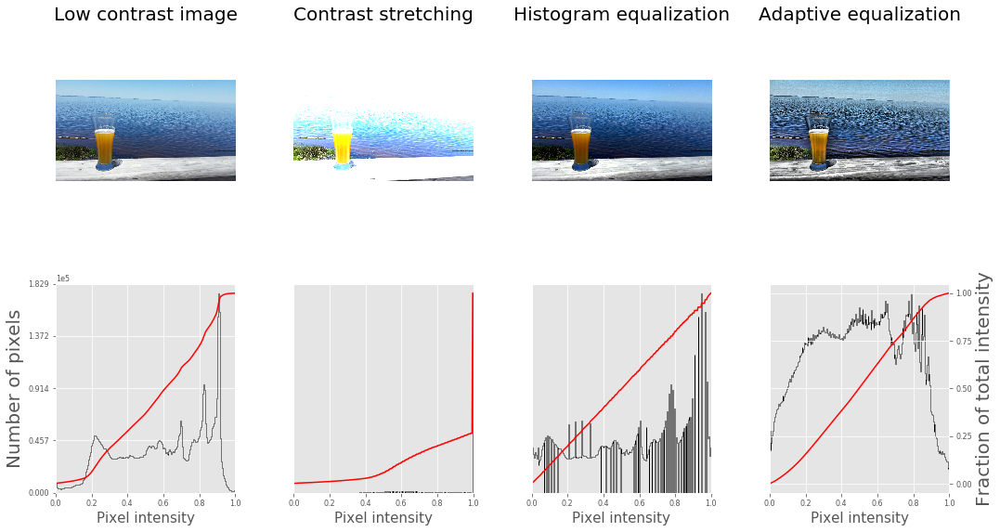

In [22]:
img = io.imread('./img/deck.jpg')
# contrast stretching
img_rescale = exposure.rescale_intensity(img, in_range=(0, 100), out_range=(0, 255))
img_eq = exposure.equalize_hist(img)
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)

fig = plb.figure(figsize=(15, 8))
axes = np.zeros((2, 4), dtype = np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1 + i, sharex = axes[0, 0], sharey=axes[0, 0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img, axes[:, 0])
axes_img.set_title('Low contrast image', size=20)
y_min, y_max = axes_hist.get_ylim()
axes_hist.set_ylabel('Number of pixels', size=20)
axes_hist.set_yticks(np.linspace(0, y_max, 5))
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img_rescale, axes[:, 1])
axes_img.set_title('Contrast stretching', size=20)
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img_eq, axes[:, 2])
axes_img.set_title('Histogram equalization', size=20)
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img_adapteq, axes[:,3])
axes_img.set_title('Adaptive equalization', size=20)
axes_cdf.set_ylabel('Fraction of total intensity', size=20)
axes_cdf.set_yticks(np.linspace(0, 1, 5))
fig.tight_layout()
plb.show()

Using the jellyfish pic:

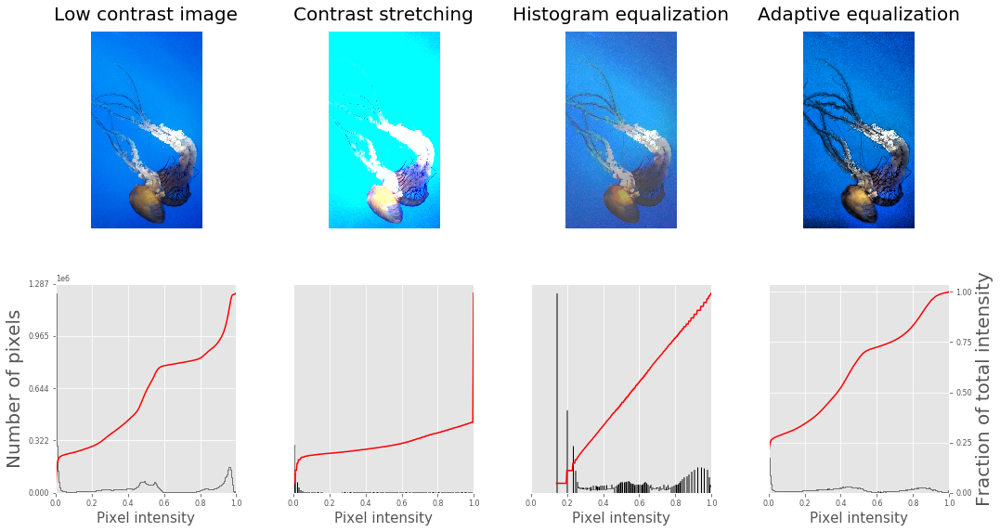

In [23]:
img = io.imread('./img/jellyfish.jpg')
# contrast stretching
img_rescale = exposure.rescale_intensity(img, in_range=(0, 100), out_range=(0, 255))
img_eq = exposure.equalize_hist(img)
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)

fig = plb.figure(figsize=(15, 8))
axes = np.zeros((2, 4), dtype = np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1 + i, sharex = axes[0, 0], sharey=axes[0, 0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img, axes[:, 0])
axes_img.set_title('Low contrast image', size=20)
y_min, y_max = axes_hist.get_ylim()
axes_hist.set_ylabel('Number of pixels', size=20)
axes_hist.set_yticks(np.linspace(0, y_max, 5))
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img_rescale, axes[:, 1])
axes_img.set_title('Contrast stretching', size=20)
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img_eq, axes[:, 2])
axes_img.set_title('Histogram equalization', size=20)
axes_img, axes_hist, axes_cdf = plot_image_and_hist(img_adapteq, axes[:,3])
axes_img.set_title('Adaptive equalization', size=20)
axes_cdf.set_ylabel('Fraction of total intensity', size=20)
axes_cdf.set_yticks(np.linspace(0, 1, 5))
fig.tight_layout()
plb.show()

### Histogram Matching

This is done with the following process:<ol><li>the cumulative histogram is computed for each image</li><li>for any given pixel $x_i$ in the input image, we find the correspnding pixel in the output image $x_j$by maching the input image's histogram with the template image's</li><li>the $x_i$ pixel's value in the cumulative histogram is matched to $x_j$ so that the distribution value in the template image is equal to that of the input image.</li><li>Replace $x_i$ with $x_j$.</li></ol>

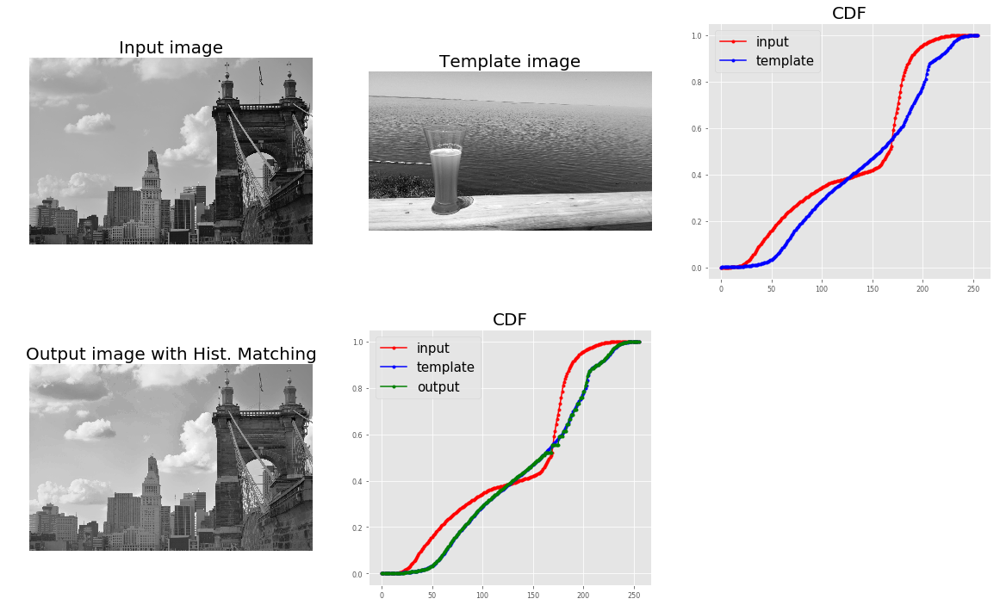

In [26]:
def cdf(im):
    '''
    computes the CDF of an image im as 2D numpy ndarray
    '''
    c, b = cumulative_distribution(im)
    # pad the beginning and ending pixels and their CDF values
    c = np.insert(c, 0, [0]*b[0])
    c = np.append(c, [1]*(255-b[-1]))
    return c

def hist_matching(c, c_t, im):
    '''
    c: CDF of input image computed with the function cdf()
    c_t: CDF of template image computed with the function cdf()
    im: input image as 2D numpy ndarray
    returns the modified pixel values for the input image
    '''
    pixels = np.arange(256)
    # find closest pixel-matches corresponding to the CDF of the input image, given the value of the CDF H of
    # the template image at the corresponding pixels, s.t. c_t = H(pixels) <=> pixels = H-1(c_t)
    new_pixels = np.interp(c, c_t, pixels)
    im = (np.reshape(new_pixels[im.ravel()], im.shape)).astype(np.uint8)
    return im

plb.gray()
im = (rgb2gray(imread('./img/roebling2.jpeg'))*255).astype(np.uint8)
im_t = (rgb2gray(imread('./img/deck.jpg'))*255).astype(np.uint8)
plb.figure(figsize=(20,12))
plb.subplot(2,3,1)
plot_image(im, 'Input image')
plb.subplot(2,3,2)
plot_image(im_t, 'Template image')
c = cdf(im)
c_t = cdf(im_t)
plb.subplot(2,3,3)
p = np.arange(256)
plb.plot(p, c, 'r.-', label='input')
plb.plot(p, c_t, 'b.-', label='template')
plb.legend(prop={'size': 15})
plb.title('CDF', size=20)
im = hist_matching(c, c_t, im)
plb.subplot(2,3,4)
plot_image(im, 'Output image with Hist. Matching')
c1 = cdf(im)
plb.subplot(2,3,5)
plb.plot(np.arange(256), c, 'r.-', label='input')
plb.plot(np.arange(256), c_t, 'b.-', label='template')
plb.plot(np.arange(256), c1, 'g.-', label='output')
plb.legend(prop={'size': 15})
plb.title('CDF', size=20)
plb.show()

### Linear Noise Smoothing

This is a function with a weighted sum of pixel values over a neighborhood that results in blurring, removing noise & (hopefully irrelevant) details. This is usually a preprocessing step. The kernel applies over the entire image, recomputing each pixel value by the weighted sum of the surrounding pixels. 

In Python, these functions are included in the PIL module, via `ImageFilter.BLUR`. Let's grab an image and add some random noise first, so we can see the effects of linear noise smoothing:

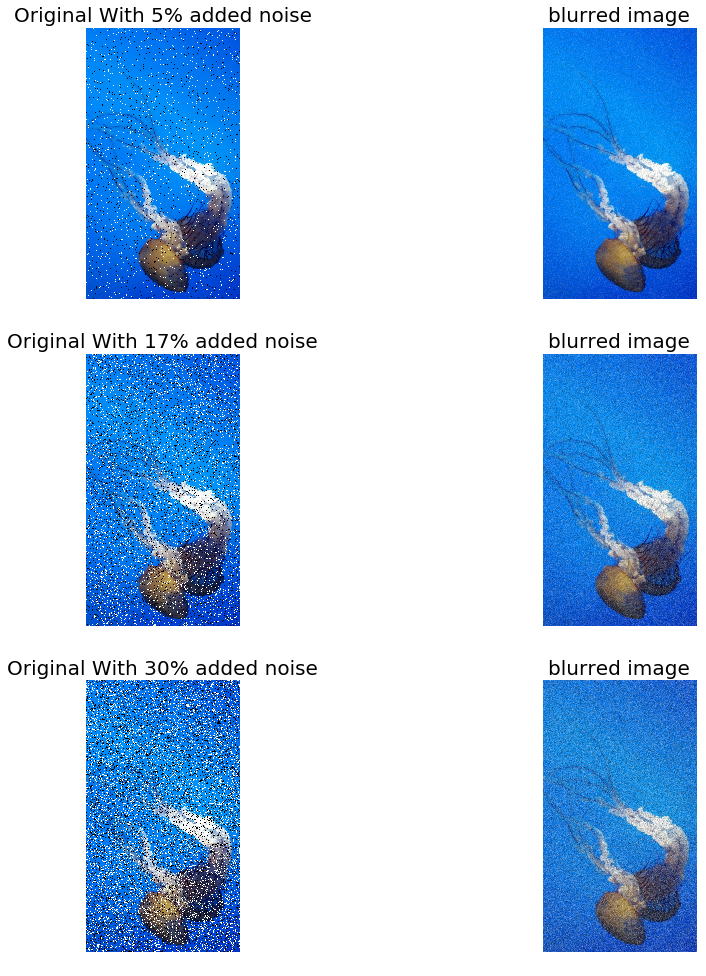

In [6]:
def plot_image(image, title=""):
    plb.title(title, size=20)
    plb.imshow(image)
    plb.axis('off')

i = 1
plb.figure(figsize=(15, 35))
for noise in np.linspace(0.05, 0.3, 3):
    img = Image.open('./img/jellyfish.jpg')
    n = int(img.width * img.height * noise)
    x, y = np.random.randint(0, img.width, n), np.random.randint(0, img.height, n)
    for (x, y) in zip(x, y):
        img.putpixel((x, y), ((0, 0, 0) if np.random.rand() < 0.5 else (255, 255, 255)))
    img.save('./img/jellyfish_{}pct.jpg'.format(100 * noise))
    plb.subplot(6, 2, i)
    plot_image(img, 'Original With {}% added noise'.format(str(int(100 * noise))))
    i += 1
    img1 = img.filter(ImageFilter.BLUR)
    plb.subplot(6, 2, i)
    plot_image(img1, 'blurred image')
    i += 1
plb.show()

...and the Box Kernel, using `ImageFilter.Kernel()`:

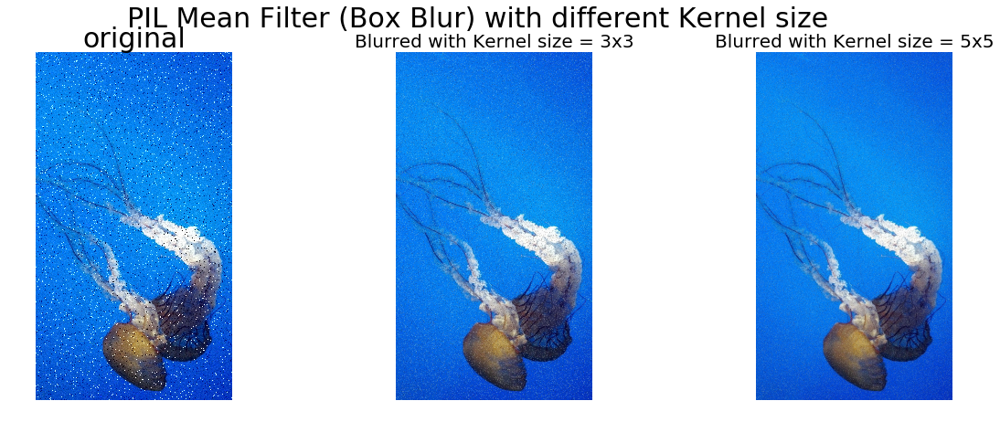

In [7]:
img = Image.open('./img/jellyfish_5.0pct.jpg')
plb.figure(figsize=(20, 7))
plb.subplot(1, 3, 1)
plb.imshow(img)
plb.title('original', size=30)
plb.axis('off')
for n in [3, 5]:
    box_blur_kernel = np.reshape(np.ones(n*n), (n, n)) / (n*n)
    img1 = img.filter(ImageFilter.Kernel((n, n), box_blur_kernel.flatten()))
    plb.subplot(1, 3, (2 if n==3 else 3))
    plot_image(img1, 'Blurred with Kernel size = {}x{}'.format(n, n))
plb.suptitle('PIL Mean Filter (Box Blur) with different Kernel size', size=30)
plb.show()

Now with Guassian, using `ImageFilter.GaussianBlur()`:

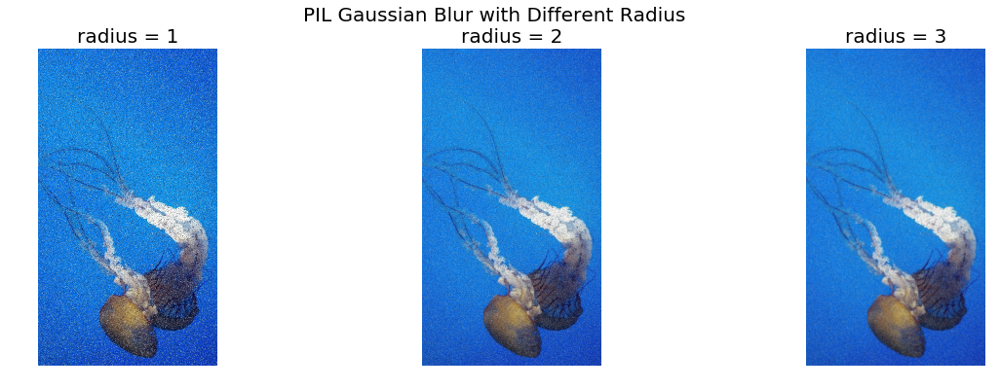

In [8]:
img = Image.open('./img/jellyfish_17.5pct.jpg')
plb.figure(figsize=(20, 6))
i = 1
for radius in range(1, 4):
    img1 = img.filter(ImageFilter.GaussianBlur(radius))
    plb.subplot(1, 3, i)
    plot_image(img1, 'radius = {}'.format(round(radius, 2)))
    i += 1
plb.suptitle('PIL Gaussian Blur with Different Radius', size=20)
plb.show()

Here, we're using two different, but similar filters available to us using PIL. They're both available in `scipy.ndimage` as well; let's compare the result of using both on the jellyfish image:

/home/ben/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


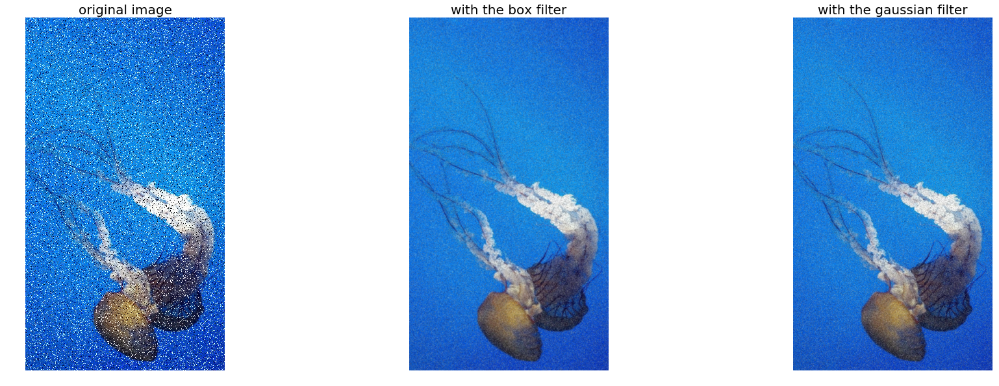

In [9]:
img = misc.imread('./img/jellyfish_17.5pct.jpg')
k = 7  # size of the kernel
img_box = ndimage.uniform_filter(img, size=(k, k, 1))
s = 2
t = (((k - 1)/2) - 0.5)/s  # truncating parameter value for a k x k gaussian kernel w/ sigma s
img_gaussian = ndimage.gaussian_filter(img, sigma=(s, s, 0), truncate=t)
fig = plb.figure(figsize=(30, 10))
plb.subplot(131)
plot_image(img, 'original image')
plb.subplot(132)
plot_image(img_box, 'with the box filter')
plb.subplot(133)
plot_image(img_gaussian, 'with the gaussian filter')
plb.show()

### Nonlinear Noise Smoothing

What makes this function <em>non</em>linear is that the filtering is performed based on the values of the pixels in the neighborhood, & doesn't apply coefficients to the sum-of-pixels. For example, we can perform noise reduction / smoothing by computing the median gray-level value in the neighborhood. The median filter is effective as it results in less blurring while denoising. 

With python, we'll look at these powerful filters using `PIL`, `scikit-image`, and `scipy.ndimage`.

First, we'll look at `PIL.ImageFilter()` to look at the median filter (ndimage's median filter is called `percentile_filter`:

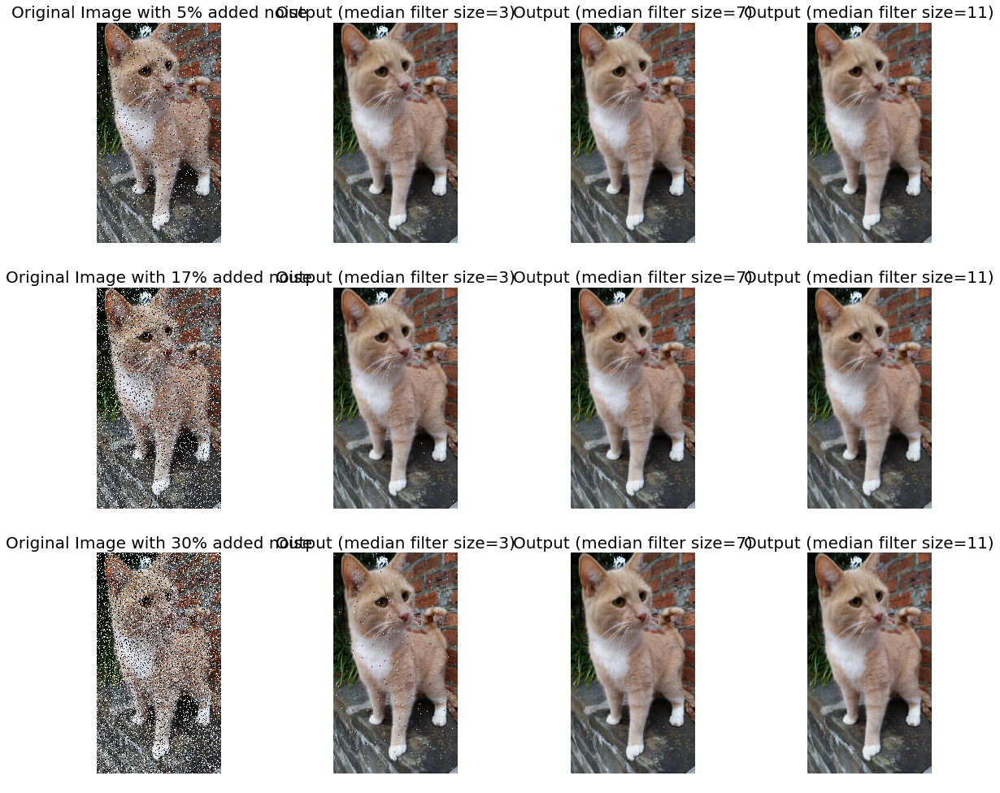

In [13]:
i = 1
plb.figure(figsize=(20, 35))
for noise in np.linspace(0.05, 0.3, 3):
    img = Image.open('./img/kolya.jpg')
    n = int(img.width * img.height * noise)
    x = np.random.randint(0, img.width, n)
    y = np.random.randint(0, img.height, n)
    for (x, y) in zip(x, y):
        img.putpixel((x, y), ((0, 0, 0) if np.random.rand() < 0.5 else (255, 255, 255)))
    img.save('./img/kolya_noise_{}.jpg'.format(noise))
    plb.subplot(6, 4, i)
    plot_image(img, 'Original Image with {}% added noise'.format(int(100 * noise)))
    i += 1
    for sz in [3, 7, 11]:
        img1 = img.filter(ImageFilter.MedianFilter(size=sz))
        plb.subplot(6, 4, i)
        plot_image(img1, 'Output (median filter size={})'.format(sz))
        i += 1
plb.show()
    

Next, we turn to the max & min filters:

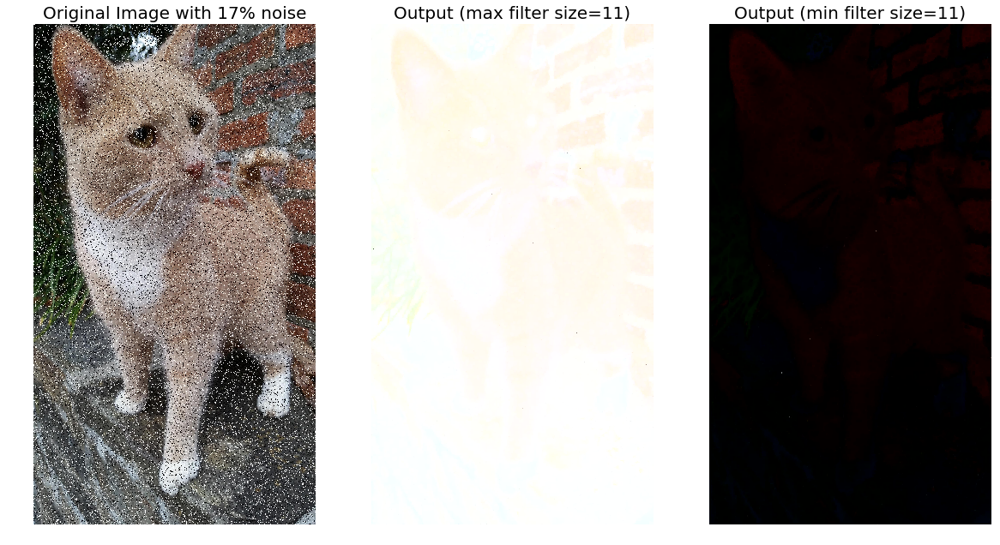

In [17]:
plb.figure(figsize=(20, 30))
img = Image.open("./img/kolya_noise_0.175.jpg")
plb.subplot(1, 3, 1)
plot_image(img, 'Original Image with 17% noise')
img1 = img.filter(ImageFilter.MaxFilter(size=sz))
plb.subplot(1, 3, 2)
plot_image(img1, 'Output (max filter size={})'.format(sz))
img1 = img.filter(ImageFilter.MinFilter(size=sz))
plb.subplot(1, 3, 3)
plot_image(img1, 'Output (min filter size={})'.format(sz))
plb.show()

Wow, that's kind of surprising. Let's try it on the jellyfish image, & with a different sized kernel:

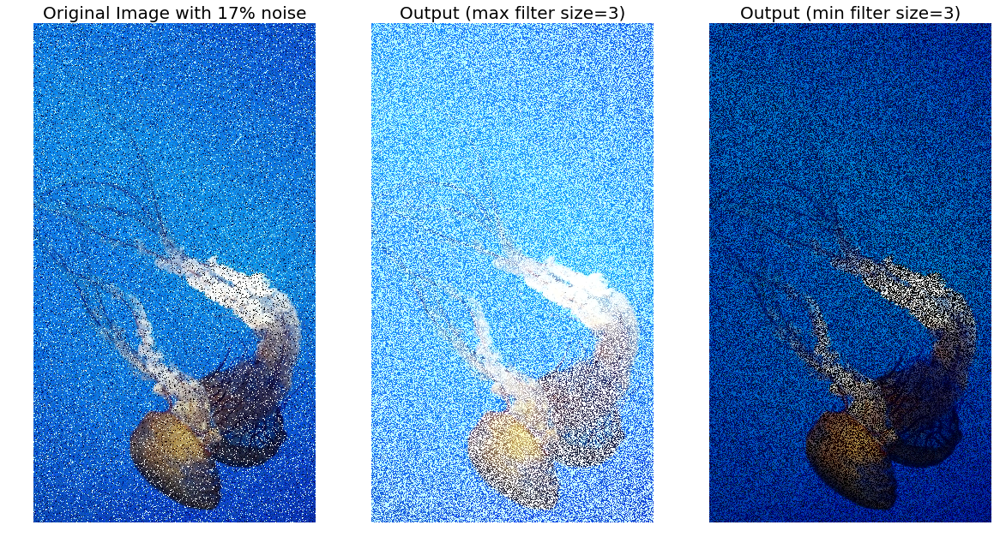

In [21]:
plb.figure(figsize=(20, 30))
img = Image.open("./img/jellyfish_17.5pct.jpg")
plb.subplot(1, 3, 1)
plot_image(img, 'Original Image with 17% noise')
img1 = img.filter(ImageFilter.MaxFilter(size=3))
plb.subplot(1, 3, 2)
plot_image(img1, 'Output (max filter size={})'.format(3))
img1 = img.filter(ImageFilter.MinFilter(size=3))
plb.subplot(1, 3, 3)
plot_image(img1, 'Output (min filter size={})'.format(3))
plb.show()

It looks like 11 would be too large of a kernel. If we reduced the kernel size even further, we may have better results.

For now though, we'll turn to the <strong>bilateral</strong> filter. This is an edge-preserving smoothing filter. This works by setting the pixel value to the weighted average of its neighbors, but only the ones within a given value range. To demonstrate this, we'll turn to `scikit-image`. This is a computationally expensive process, so this takes awhile (about 40 minutes at home).

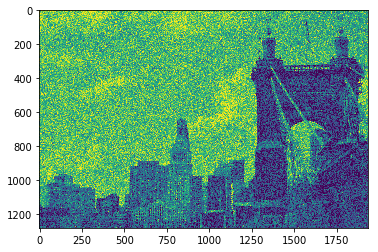

In [23]:
img = color.rgb2gray(img_as_float(io.imread('./img/roebling2.jpeg')))
sigma = 0.155
noisy = random_noise(img, var=sigma ** 2)
plb.imshow(noisy)

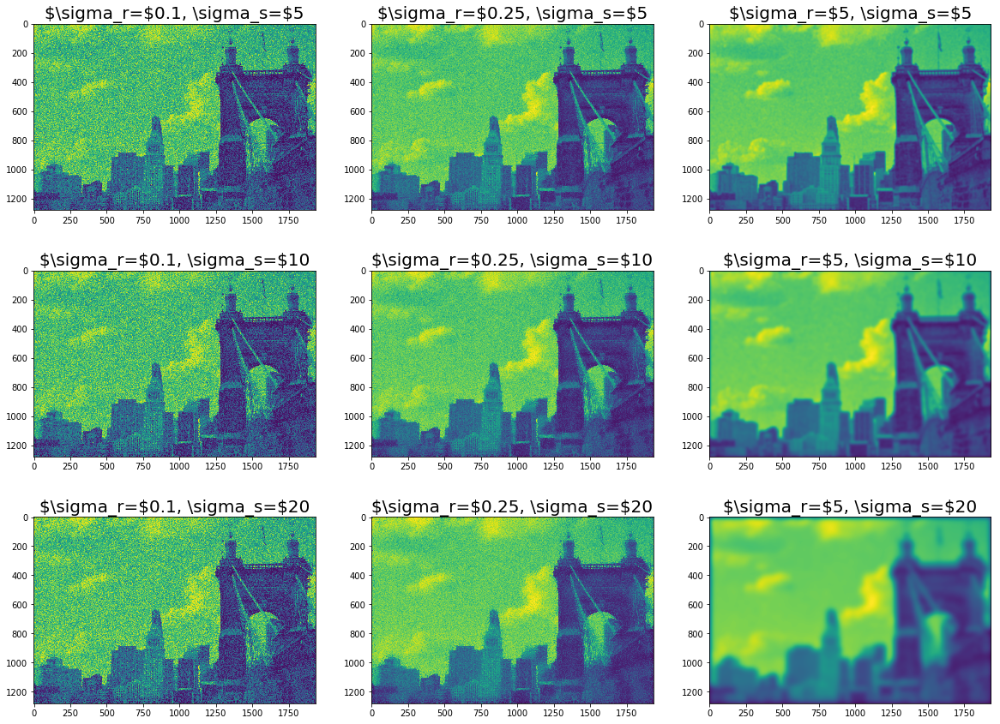

In [24]:
plb.figure(figsize=(20, 15))
i = 1
for sigma_sp in [5, 10, 20]:
    for sigma_col in [0.1, 0.25, 5]:
        plb.subplot(3, 3, i)
        plb.imshow(denoise_bilateral(noisy, sigma_color=sigma_col,
                                    sigma_spatial=sigma_sp, multichannel=False))  # from skimage.restoration
        plb.title(r'$\sigma_r=${}, \sigma_s=${}'.format(sigma_col, sigma_sp), size=20)
        i += 1
plb.show()        

We'll turn now to <strong>non-local means</strong>, which is a denoising algorithm that preserves textures. For any pixel in an image, the weighted average of only the nearby pixels that have similar local neighbors are used to set the value of each pixel of interest. The $h$ parameter controls the decay in patch weights as a distance between patches. If $h$ is large, it allows more smoothing between dissimilar patches:

Estimated Noise Standard Deviation = 0.20377573538293428
PSNR (noisy) = 13.40
PSNR (slow) = 24.18
PSNR (fast) = 23.68


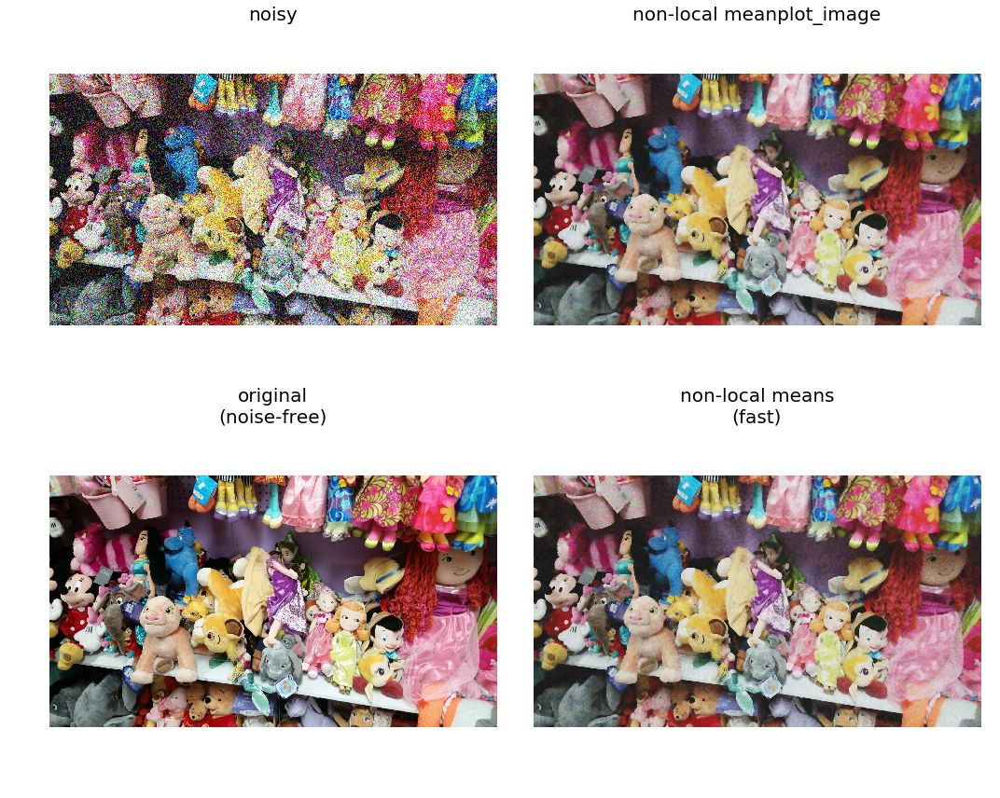

In [30]:
def plot_image_axes(image, axes, title):
    axes.imshow(image)
    axes.axis('off')
    axes.set_title(title, size=20)
    
toys = img_as_float(imread('./img/toys.jpg'))
sigma = 0.25
noisy = toys + sigma * np.random.standard_normal(toys.shape)
noisy = np.clip(noisy, 0, 1)
sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("Estimated Noise Standard Deviation = {}".format(sigma_est))
patch_kw = dict(patch_size=5, patch_distance=6, multichannel=True)
# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False, **patch_kw)
# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, fast_mode=True, **patch_kw)
fig, axes = plb.subplots(nrows=2, ncols=2, figsize=(15, 12), sharex=True, sharey=True)
plot_image_axes(noisy, axes[0, 0], 'noisy')
plot_image_axes(denoise, axes[0, 1], 'non-local meanplot_image')
plot_image_axes(toys, axes[1, 0], 'original\n(noise-free)')
plot_image_axes(denoise_fast, axes[1, 1], 'non-local means\n(fast)')
fig.tight_layout()

psnr_noisy = compare_psnr(toys, noisy)
psnr = compare_psnr(toys, denoise.astype(np.float64))
psnr_fast = compare_psnr(toys, denoise_fast.astype(np.float64))
print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))
# PSNR (noisy) = 13.04 # PSNR (slow) = 26.25 # PSNR (fast) = 25.84
plb.show()